## Turismo en Rio de Janeiro 
# importar os pacotes necessários
 

In [8]:

# pip install wordcloud -q

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator



# importar o arquivo csv em um df


In [9]:
df = pd.read_csv("listings.csv")
 


# eliminar as colunas com valores ausentes


In [11]:
summary = df.dropna(subset=['summary'], axis=0)['summary']

summary

0        Please note that special rates apply for Carni...
1        Our apartment is a little gem, everyone loves ...
2        This nice and clean 1 bedroom apartment is loc...
3        This cosy apartment  is just a few steps away ...
4        Our newly renovated studio is located in the b...
                               ...                        
35446    Single room with a single mattress, can be pla...
35447    Moro sozinha com dois gatos carinhosos e manso...
35448    This apartment comes with 2 bedrooms, a flat-s...
35449    Nosso apartamento é aconchegante e funcional. ...
35450    Condomínio com segurança 24hrs por dia Mercado...
Name: summary, Length: 33704, dtype: object

# exemplos de descrições para os imóveis no Airbnb


In [12]:
display(summary.iloc[100])
display(summary.iloc[120])
display(summary.iloc[133])



'Ambiente tranquilo e familiar,ótimo para viajantes que no final do dia queiram descansar e ter uma noite tranquila. Excelente bairro que fica próximo a Lagoa Rodrigo de Freitas, que é um dos lindos cartões postais de nossa cidade. Aguardo você!'

'O quarto é lindo e bem grande e possui acesso para a varanda do apartamento. Possui grandes armários,  bancada. Esse é o quarto maior de um apartamento/cobertura de 150m2 que possui 3 quartos, sala, varandas em torno de todo o apartamento, cozinha ampla com dependências. Esse quarto não possui banheiro privativo. Os hospedes desse quarto compartilham o banheiro com as pessoas que estiverem utilizando o segundo quarto. O terceiro quarto é a suíte que normalmente é utilizada por mim e meu marido.'

'Aconchegante, amplo, básico, arejado, iluminado com luz natural em prédio seguro e familiar. Prédio com portaria 24 horas e cameras de segurança em todos os andares do edifício. Tudo isto em Copacabana a quase 1 quadra do mar! É o segundo prédio da segunda quadra da praia!!! Está localizado na Av. Prado Junior quase esquina com Av. N.Sra de Copacabana!'


# concatenar as palavras


In [14]:
all_summary = " ".join(s for s in summary)

all_summary

'Please note that special rates apply for Carnival. I usually host groups of up to 5 people and prefer to rent for a minimum stay of 7 nights. Please contact me to discuss. - Beautiful, sunny 2 bedroom (90 square meters) in 24h doorman building - 1 min. to walk to Copacabana beach - Spacious living room, 2  bedrooms with 2 full-size beds (each sleeps 2) - High speed WiFi (10MB); phone (local landline calls free) Our apartment is a little gem, everyone loves staying there! Best location, 2 blocks to the subway, 3 blocks to the beach, close to bars, restaurants, supermarket, banks, public transportation and all you need! Wi-fi, cable TV, air con and fan! This nice and clean 1 bedroom apartment is located in the best area in Rio: Just 2 blocks from Ipanema beach, posto 10, right next to Leblon and Lagoa. Perfect for those who want to feel like a local, a real "carioca".   This cosy apartment  is just a few steps away from the famous Copacabana and in a walking distance of the stunning Ipa

# lista de stopword


In [15]:
STOPWORDS

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 

In [18]:
stopwords = set(STOPWORDS)
stopwords.update(["da", "meu", "em", "você", "de", "ao", "os"])



In [19]:
stopwords

{'a',
 'aaa',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'ao',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'da',
 'de',
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'em',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'meu',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',

# gerar uma wordcloud


In [20]:
wordcloud = WordCloud(stopwords=stopwords,
                      background_color="black",
                      width=1600, height=800).generate(all_summary)



# mostrar a imagem final


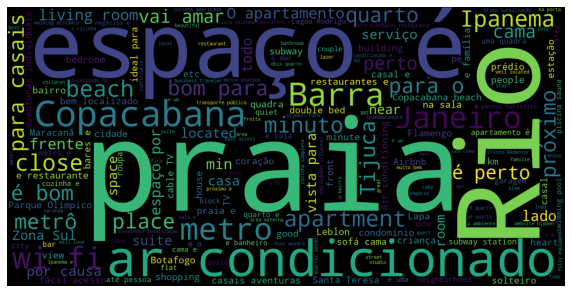

In [21]:
fig, ax = plt.subplots(figsize=(10,6))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()

plt.imshow(wordcloud);
wordcloud.to_file("Summary_wordcloud.png")




In [23]:

# endereço LOCAL da SUA imagem
rio_mask = np.array(Image.open("cristorio.jpg"))


In [24]:
   
# gerar uma wordcloud
wordcloud = WordCloud(stopwords=stopwords,
                      background_color="white",
                      width=1000, height=1000, max_words=2000,
                      mask=rio_mask, 
                      max_font_size=200,
                      min_font_size=1).generate(all_summary)



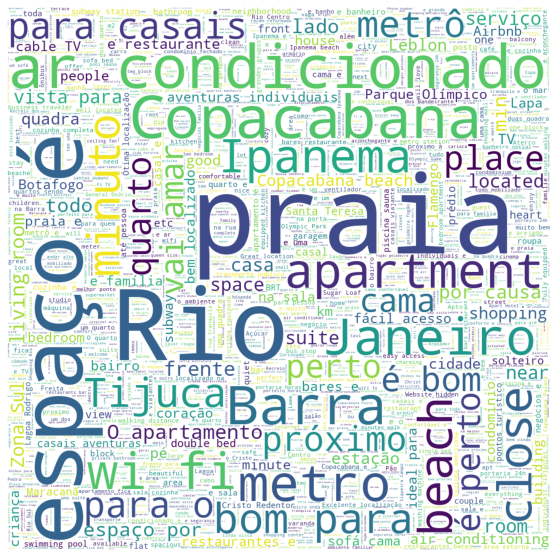

In [25]:
# mostrar a imagem final
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()

plt.imshow(wordcloud)
wordcloud.to_file("Rio-turismo.png")

In [27]:
# gerar uma wordcloud
wordcloud = WordCloud(stopwords=stopwords,
                      background_color="white",
                      width=1000, height=1000, max_words=2000,
                      mask=rio_mask, 
                      max_font_size=200,
                      min_font_size=1).generate(all_summary)



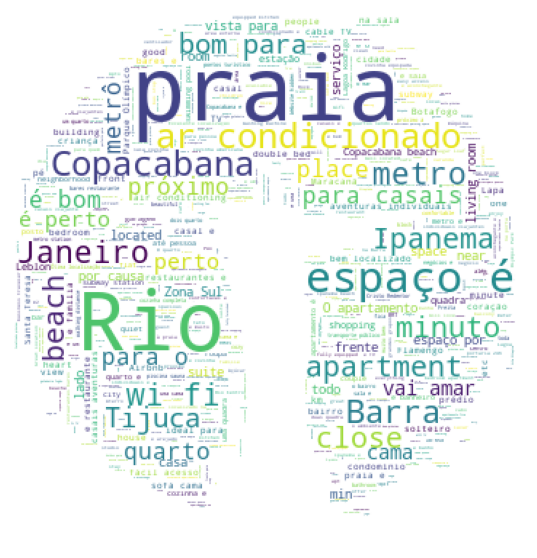

In [30]:
# mostrar a imagem final com Mask
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()

plt.imshow(wordcloud)
wordcloud.to_file("Rio_Mask.png")

Gracias!